In [119]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, LinearRegression, LassoCV, RidgeCV, Ridge
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier


from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.metrics import r2_score, mean_squared_error
from haversine import haversine
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.feature_selection import mutual_info_regression
from math import sqrt


%matplotlib inline

pd.set_option("display.max_rows", 50)
pd.set_option("display.max_columns", 100)

import seaborn as sns
import folium
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon
from functools import partial
import pyproj

In [120]:
test_file = './datasets/test.csv'
train_file = './datasets/train.csv'
spray_file = './datasets/spray.csv'
weather_file = './datasets/weather.csv'

train_df = pd.read_csv(train_file)
test_df = pd.read_csv(test_file)
spray_df = pd.read_csv(spray_file)
weather_df = pd.read_csv(weather_file)

In [121]:
spray_df.head(20)

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858
5,2011-08-29,6:57:48 PM,42.390395,-88.088315
6,2011-08-29,6:57:58 PM,42.390673,-88.088002
7,2011-08-29,6:58:08 PM,42.391027,-88.088002
8,2011-08-29,6:58:18 PM,42.391403,-88.088003
9,2011-08-29,6:58:28 PM,42.391718,-88.087995


In [122]:
spray_df['Date'] = pd.to_datetime(spray_df['Date'])
spray_df.set_index('Date', inplace=True)
spray_df.index

DatetimeIndex(['2011-08-29', '2011-08-29', '2011-08-29', '2011-08-29',
               '2011-08-29', '2011-08-29', '2011-08-29', '2011-08-29',
               '2011-08-29', '2011-08-29',
               ...
               '2013-09-05', '2013-09-05', '2013-09-05', '2013-09-05',
               '2013-09-05', '2013-09-05', '2013-09-05', '2013-09-05',
               '2013-09-05', '2013-09-05'],
              dtype='datetime64[ns]', name='Date', length=14835, freq=None)

In [123]:
# Remove Longitude outliers
spray_df = spray_df.drop(spray_df[spray_df['Longitude']<-87.9].index)

# Remove Latitude outliers
spray_df = spray_df.drop(spray_df[spray_df['Latitude']>42.0].index)

In [124]:
# Dict of all Traps coordinates

traps_coordinates = {
'T001': {'Latitude': 41.953705, 'Longitude': -87.733974},
 'T002': {'Latitude': 41.95469, 'Longitude': -87.800991},
 'T003': {'Latitude': 41.964242, 'Longitude': -87.757639},
 'T004': {'Latitude': 41.962728, 'Longitude': -87.748367},
 'T005': {'Latitude': 41.942114, 'Longitude': -87.776385},
 'T006': {'Latitude': 41.990284, 'Longitude': -87.797127},
 'T007': {'Latitude': 41.994991, 'Longitude': -87.769279},
 'T008': {'Latitude': 42.008314, 'Longitude': -87.777921},
 'T009': {'Latitude': 41.981964, 'Longitude': -87.812827},
 'T009__2': {'Latitude': 41.992478, 'Longitude': -87.862995},
 'T011': {'Latitude': 41.944869, 'Longitude': -87.832763},
 'T012': {'Latitude': 41.991429, 'Longitude': -87.747113},
 'T013': {'Latitude': 41.923738, 'Longitude': -87.785288},
 'T014': {'Latitude': 41.970248, 'Longitude': -87.787992},
 'T015': {'Latitude': 41.974089, 'Longitude': -87.824812},
 'T016': {'Latitude': 42.011601, 'Longitude': -87.811506},
 'T017': {'Latitude': 41.960616, 'Longitude': -87.777189},
 'T018': {'Latitude': 42.010412, 'Longitude': -87.66214},
 'T019': {'Latitude': 41.94983, 'Longitude': -87.698457},
 'T025': {'Latitude': 41.979243, 'Longitude': -87.750938},
 'T027': {'Latitude': 41.984809, 'Longitude': -87.728492},
 'T028': {'Latitude': 41.986921, 'Longitude': -87.689778},
 'T030': {'Latitude': 41.89923, 'Longitude': -87.716788},
 'T031': {'Latitude': 41.801498, 'Longitude': -87.763416},
 'T033': {'Latitude': 41.906638, 'Longitude': -87.701431},
 'T034': {'Latitude': 41.843811, 'Longitude': -87.686763},
 'T035': {'Latitude': 41.836644, 'Longitude': -87.677737},
 'T035__2': {'Latitude': 41.763733, 'Longitude': -87.742302},
 'T036': {'Latitude': 41.837085, 'Longitude': -87.729384},
 'T037': {'Latitude': 41.921177, 'Longitude': -87.79518},
 'T039': {'Latitude': 41.911824, 'Longitude': -87.726737},
 'T040': {'Latitude': 41.852652, 'Longitude': -87.719887},
 'T043': {'Latitude': 41.857402, 'Longitude': -87.694991},
 'T044': {'Latitude': 41.883284, 'Longitude': -87.705085},
 'T045': {'Latitude': 41.9216, 'Longitude': -87.666455},
 'T046': {'Latitude': 41.891118, 'Longitude': -87.654491},
 'T047': {'Latitude': 41.868142, 'Longitude': -87.696269},
 'T048': {'Latitude': 41.867108, 'Longitude': -87.654224},
 'T049': {'Latitude': 41.896282, 'Longitude': -87.655232},
 'T050': {'Latitude': 41.919343, 'Longitude': -87.694259},
 'T051': {'Latitude': 41.846283, 'Longitude': -87.656913},
 'T054': {'Latitude': 41.921965, 'Longitude': -87.632085},
 'T054C': {'Latitude': 41.925652, 'Longitude': -87.63359},
 'T060': {'Latitude': 41.823065, 'Longitude': -87.678378},
 'T061': {'Latitude': 41.801179, 'Longitude': -87.679447},
 'T062': {'Latitude': 41.800737, 'Longitude': -87.71188},
 'T063': {'Latitude': 41.82561, 'Longitude': -87.726549},
 'T065': {'Latitude': 41.778297, 'Longitude': -87.752411},
 'T066': {'Latitude': 41.77166, 'Longitude': -87.703047},
 'T067': {'Latitude': 41.759346, 'Longitude': -87.745602},
 'T069': {'Latitude': 41.768388, 'Longitude': -87.678649},
 'T070': {'Latitude': 41.797616, 'Longitude': -87.797894},
 'T071': {'Latitude': 41.781416, 'Longitude': -87.776532},
 'T072': {'Latitude': 41.74785, 'Longitude': -87.702716},
 'T073': {'Latitude': 41.773215, 'Longitude': -87.60088},
 'T074': {'Latitude': 41.822536, 'Longitude': -87.666343},
 'T075': {'Latitude': 41.799282, 'Longitude': -87.585487},
 'T076': {'Latitude': 41.794781, 'Longitude': -87.615989},
 'T077': {'Latitude': 41.778748, 'Longitude': -87.586427},
 'T078': {'Latitude': 41.775051, 'Longitude': -87.655356},
 'T079': {'Latitude': 41.766202, 'Longitude': -87.562889},
 'T080': {'Latitude': 41.754676, 'Longitude': -87.612922},
 'T081': {'Latitude': 41.821582, 'Longitude': -87.627796},
 'T082': {'Latitude': 41.803423, 'Longitude': -87.642984},
 'T083': {'Latitude': 41.754292, 'Longitude': -87.590773},
 'T084': {'Latitude': 41.692555, 'Longitude': -87.598865},
 'T085': {'Latitude': 41.721474, 'Longitude': -87.648064},
 'T086': {'Latitude': 41.688324, 'Longitude': -87.676709},
 'T088': {'Latitude': 41.869107, 'Longitude': -87.696293},
 'T089': {'Latitude': 41.723195, 'Longitude': -87.64997},
 'T090': {'Latitude': 41.868077, 'Longitude': -87.666901},
 'T091': {'Latitude': 41.862292, 'Longitude': -87.64886},
 'T092': {'Latitude': 41.869216, 'Longitude': -87.627561},
 'T094': {'Latitude': 41.720848, 'Longitude': -87.666014},
 'T094B': {'Latitude': 41.71914, 'Longitude': -87.669539},
 'T095': {'Latitude': 41.704336, 'Longitude': -87.703736},
 'T096': {'Latitude': 41.731922, 'Longitude': -87.677512},
 'T097': {'Latitude': 41.644612, 'Longitude': -87.604498},
 'T099': {'Latitude': 41.733643, 'Longitude': -87.55551},
 'T100': {'Latitude': 41.717753, 'Longitude': -87.531657},
 'T102': {'Latitude': 41.750498, 'Longitude': -87.605294},
 'T103': {'Latitude': 41.702724, 'Longitude': -87.536497},
 'T107': {'Latitude': 41.729669, 'Longitude': -87.582699},
 'T114': {'Latitude': 41.798697, 'Longitude': -87.736812},
 'T115': {'Latitude': 41.673408, 'Longitude': -87.599862},
 'T128': {'Latitude': 41.704572, 'Longitude': -87.565666},
 'T129': {'Latitude': 41.891126, 'Longitude': -87.61156},
 'T135': {'Latitude': 41.662014, 'Longitude': -87.724608},
 'T138': {'Latitude': 41.726465, 'Longitude': -87.585413},
 'T141': {'Latitude': 41.961743, 'Longitude': -87.76007},
 'T142': {'Latitude': 41.953067, 'Longitude': -87.776792},
 'T143': {'Latitude': 41.999129, 'Longitude': -87.795585},
 'T144': {'Latitude': 41.94016, 'Longitude': -87.794896},
 'T145': {'Latitude': 41.878114, 'Longitude': -87.629798},
 'T146': {'Latitude': 41.958271, 'Longitude': -87.702575},
 'T147': {'Latitude': 41.932094, 'Longitude': -87.700117},
 'T148': {'Latitude': 42.01743, 'Longitude': -87.687769},
 'T149': {'Latitude': 41.994469, 'Longitude': -87.667736},
 'T150': {'Latitude': 42.006858, 'Longitude': -87.675919},
 'T151': {'Latitude': 41.916265, 'Longitude': -87.800515},
 'T152': {'Latitude': 41.846075, 'Longitude': -87.716277},
 'T153': {'Latitude': 41.907645, 'Longitude': -87.760886},
 'T154': {'Latitude': 41.918705, 'Longitude': -87.752329},
 'T155': {'Latitude': 41.776156, 'Longitude': -87.778927},
 'T156': {'Latitude': 41.772846, 'Longitude': -87.740029},
 'T157': {'Latitude': 41.825902, 'Longitude': -87.667827},
 'T158': {'Latitude': 41.682587, 'Longitude': -87.707973},
 'T159': {'Latitude': 41.732984, 'Longitude': -87.649642},
 'T160': {'Latitude': 41.903002, 'Longitude': -87.688267},
 'T161': {'Latitude': 41.719059, 'Longitude': -87.675088},
 'T162': {'Latitude': 41.725517, 'Longitude': -87.614258},
 'T200': {'Latitude': 41.678618, 'Longitude': -87.559308},
 'T206': {'Latitude': 41.737052, 'Longitude': -87.543067},
 'T209': {'Latitude': 41.740641, 'Longitude': -87.546587},
 'T212': {'Latitude': 41.680946, 'Longitude': -87.535198},
 'T215': {'Latitude': 41.686398, 'Longitude': -87.531635},
 'T218': {'Latitude': 41.948167, 'Longitude': -87.730698},
 'T219': {'Latitude': 41.966987, 'Longitude': -87.674677},
 'T220': {'Latitude': 41.963976, 'Longitude': -87.69181},
 'T221': {'Latitude': 41.659112, 'Longitude': -87.538693},
 'T222': {'Latitude': 41.925198, 'Longitude': -87.746381},
 'T223': {'Latitude': 41.973845, 'Longitude': -87.805059},
 'T224': {'Latitude': 41.947227, 'Longitude': -87.671457},
 'T225': {'Latitude': 41.743402, 'Longitude': -87.731435},
 'T226': {'Latitude': 41.793818, 'Longitude': -87.654234},
 'T227': {'Latitude': 41.728495, 'Longitude': -87.600963},
 'T228': {'Latitude': 41.951866, 'Longitude': -87.725057},
 'T229': {'Latitude': 41.753411, 'Longitude': -87.639817},
 'T230': {'Latitude': 41.904194, 'Longitude': -87.756155},
 'T231': {'Latitude': 41.98728, 'Longitude': -87.666066},
 'T232': {'Latitude': 41.912563, 'Longitude': -87.668055},
 'T233': {'Latitude': 42.009876, 'Longitude': -87.807277},
 'T235': {'Latitude': 41.776428, 'Longitude': -87.627096},
 'T236': {'Latitude': 41.994679, 'Longitude': -87.770899},
 'T237': {'Latitude': 41.738903, 'Longitude': -87.695443},
 'T238': {'Latitude': 41.753391, 'Longitude': -87.707394},
 'T900': {'Latitude': 41.974689, 'Longitude': -87.890615},
 'T903': {'Latitude': 41.957799, 'Longitude': -87.930995},
 'T090A': {'Latitude': 41.690423, 'Longitude': -87.656929},
 'T090C': {'Latitude': 41.675876, 'Longitude': -87.651515},
 'T128A': {'Latitude': 41.738583, 'Longitude': -87.567726},
 'T234': {'Latitude': 41.942285, 'Longitude': -87.761726},
 'T218B': {'Latitude': 41.94828, 'Longitude': -87.74134},
 'T065A': {'Latitude': 41.777689, 'Longitude': -87.749149},
 'T002A': {'Latitude': 41.965571, 'Longitude': -87.781978},
 'T090B': {'Latitude': 41.868533, 'Longitude': -87.661638},
 'T200A': {'Latitude': 41.731929, 'Longitude': -87.54854},
 'T218C': {'Latitude': 41.933652, 'Longitude': -87.738416},
 'T002B': {'Latitude': 41.951878, 'Longitude': -87.789234},
 'T218A': {'Latitude': 41.95477, 'Longitude': -87.73089},
 'T200B': {'Latitude': 41.646541, 'Longitude': -87.543762}
}

In [132]:
# Create a Traps df with all the coords
traps_df = pd.DataFrame([(traps_coordinates[trap]['Longitude'], traps_coordinates[trap]['Latitude']) for trap in traps_coordinates.keys()], 
                    columns=['Longitude','Latitude'])

In [133]:
# Read shapefile of Chicago city map
street_map = gpd.read_file('C:/Users/leagu/OneDrive/GA/my_materials/project_4/datasets/chicago_boundaries/geo_export_ad9ad039-db1b-43fb-9fbb-525d4e0645c3.shp')

In [155]:
street_map.crs

<Geographic 2D CRS: GEOGCS["WGS84(DD)",DATUM["WGS84",SPHEROID["WGS84", ...>
Name: WGS84(DD)
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- undefined
Datum: WGS84
- Ellipsoid: WGS84
- Prime Meridian: Greenwich

In [142]:
# Create geopandas DataFrame for both spray and traps data

crs = {'init':'epsg:4326'}
spray_geometry = [Point(xy) for xy in zip(spray_df['Longitude'], spray_df['Latitude'])]
trap_geometry = [Point(xy) for xy in [(traps_coordinates[trap]['Longitude'], traps_coordinates[trap]['Latitude']) for trap in traps_coordinates.keys()]]

geo_spray_df = gpd.GeoDataFrame(spray_df, crs=crs, geometry=spray_geometry)

geo_traps_df = gpd.GeoDataFrame(traps_df, crs=crs, geometry=trap_geometry)

C:\Users\leagu\anaconda3\envs\datascience\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\leagu\anaconda3\envs\datascience\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


<AxesSubplot: >

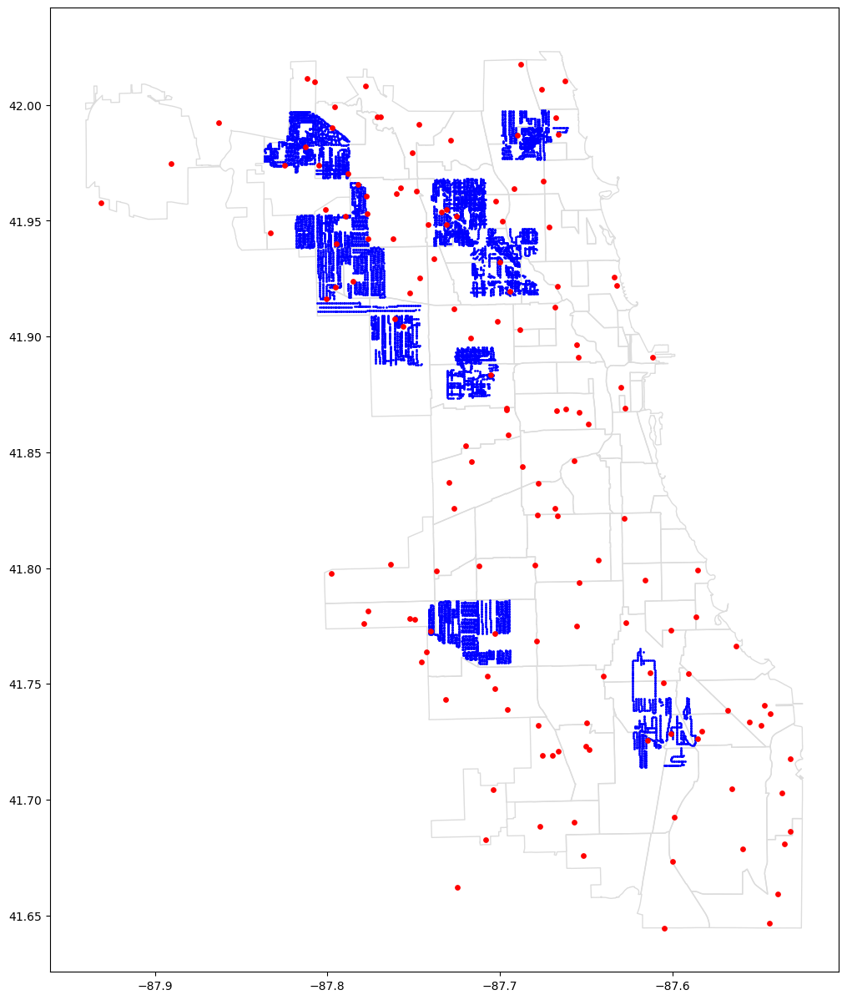

In [182]:
# Plot map of sprays done and traps' locations (geometry in degrees)
fig, ax = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax, color='none', edgecolor='gainsboro')
geo_spray_df.plot(ax=ax, markersize=1, color='blue', marker='o')
geo_traps_df.plot(ax=ax, markersize=15, color='red', marker='o')

# Most sprays done in the north as expected where there are higher concentrations of WnvPresent and NumMosquitos
# Sprays done in the south also corresponds to areas where there have been a sharp increase in NumMosquitos clusters

In [148]:
# Convert geo_spray and geo_traps to meters unit
geo_spray_meters = geo_spray_df.to_crs('EPSG:2263')
geo_traps_meters = geo_traps_df.to_crs('EPSG:2263')

In [162]:
geo_spray_meters

,Time,Latitude,Longitude,geometry
Date,,,,
2011-09-07,7:52:52 PM,41.981433,-87.787777,POINT (-2749876.358 955730.372)
2011-09-07,7:53:02 PM,41.980998,-87.787778,POINT (-2749901.658 955573.854)
2011-09-07,7:53:12 PM,41.980560,-87.787762,POINT (-2749922.225 955415.354)
2011-09-07,7:53:22 PM,41.980198,-87.787758,POINT (-2749941.992 955285.021)
2011-09-07,7:53:32 PM,41.979752,-87.787765,POINT (-2749969.302 955124.516)
...,...,...,...,...
2013-08-29,9:25:46 PM,41.980493,-87.684137,POINT (-2722090.544 950990.397)
2013-08-29,9:25:56 PM,41.980085,-87.684428,POINT (-2722192.054 950855.721)
2013-08-29,9:26:06 PM,41.980050,-87.685138,POINT (-2722384.776 950873.162)


<AxesSubplot: >

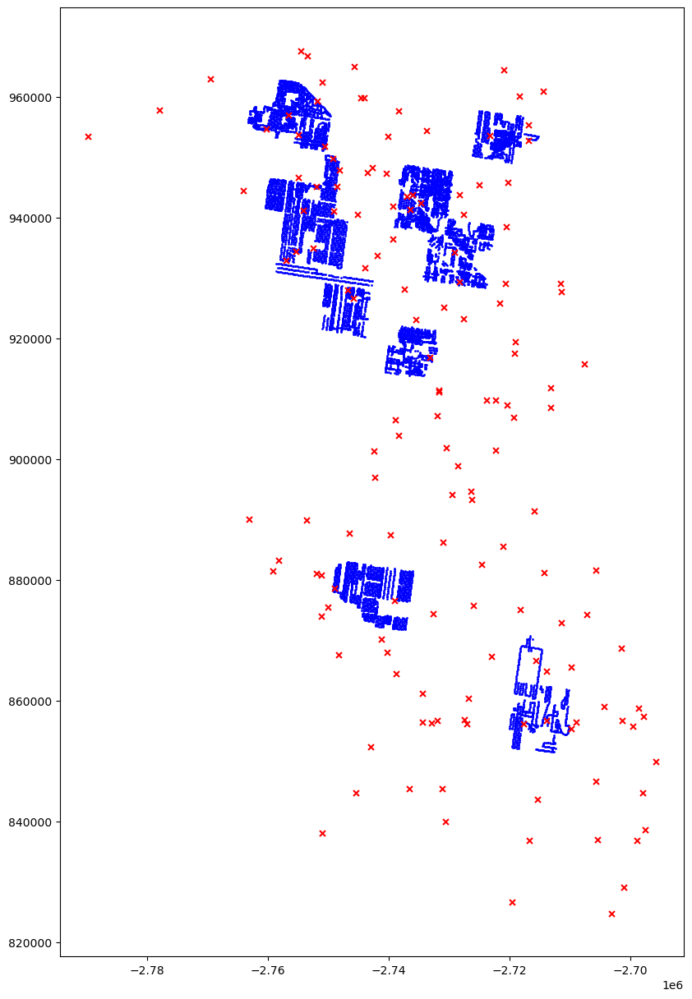

In [157]:
# Plot map of sprays done and traps' locations using coords in meters
# cannot convert street_map into meters geometry so no overlay here... 

fig, ax1 = plt.subplots(figsize=(15,15))
# street_map.plot(ax=ax1, color='none', edgecolor='gainsboro')
geo_spray_meters.plot(ax=ax1, markersize=1, color='blue', marker='o')
geo_traps_meters.plot(ax=ax1, markersize=25, color='red', marker='x')

In [160]:
# Testing calcs to compute distance in meters between spray points and trap
distances = geo_spray_meters.geometry.distance(geo_traps_meters.iloc[0].geometry)
distances

Date
2011-09-07    17785.244546
2011-09-07    17696.045838
2011-09-07    17603.002814
2011-09-07    17529.324033
2011-09-07    17441.735297
                  ...     
2013-08-29    16706.377293
2013-08-29    16555.220968
2013-08-29    16390.913335
2013-08-29    16261.114380
2013-08-29    16100.872422
Length: 11614, dtype: float64

<AxesSubplot: >

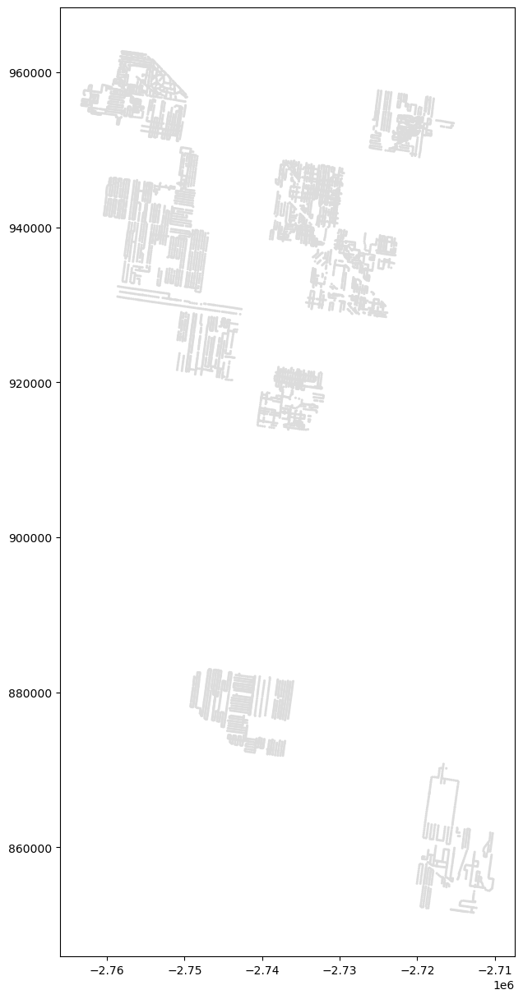

In [189]:
# Visualizing the sprays' effective zones

buffer_zone = geo_spray_meters.geometry.buffer(90)   # input buffer zone in meters

fig, ax2 = plt.subplots(figsize=(15,15))
buffer_zone.plot(ax=ax2, color='none', edgecolor='gainsboro')

In [190]:
# Lumping all the sprays' buffer zones together as one multipolygon geometry object
my_union = buffer_zone.geometry.unary_union
my_union

In [191]:
# Iterating through the 151 traps to see if any falls within 100m radius of each spray point

count=0
for i in range(len(geo_traps_meters)):
    if my_union.contains(geo_traps_meters.iloc[i].geometry):
        count+=1
        
print(count)

# Within 50m: only 8 traps in zone
# Within 90m: only 14 traps in zone
# Within 100m: only 14 traps in zone (which are these 14 traps?)
# Within 400m: only 30 traps in zone
# Within 1km: only 33 traps in zone (rest are not within the spray buffer zone anymore)

# So next question is: how far a zone is each spray effective for?
# With only 14 traps within zone, it seems deliberate that sprays are done while avoiding the Traps, 
# this is to avoid influencing the results from the Traps so no need to remove maybe?

14


**from ChatGPT**  
The effective range of West Nile virus (WNV) sprays can vary depending on several factors, including the type of pesticide used, the spray method, and environmental conditions. However, in general, the effective range of WNV sprays is typically between 100-300 feet (30-90 meters) from the point of application.

Most WNV sprays use an ultra-low volume (ULV) spray method, which creates small droplets that can be carried by the wind. The droplets can drift and disperse, potentially reaching areas beyond the immediate vicinity of the application. However, the effectiveness of the spray decreases as the distance from the point of application increases.

In [207]:
# Identify the 14 Traps which fall within the buffer zone of any of the sprays
traps_in_zone = []

for i in range(len(geo_traps_meters)):
    if my_union.contains(geo_traps_meters.iloc[i].geometry):
        traps_in_zone.append(list(traps_coordinates.items())[i][0])   # create list to get dict keys by index pos

In [206]:
traps_in_zone

# What are the counts of WnvPresent in these 14 Traps? Must be zero?

['T006',
 'T014',
 'T015',
 'T037',
 'T044',
 'T050',
 'T153',
 'T218',
 'T223',
 'T228',
 'T230',
 'T002A',
 'T002B',
 'T218A']

In [221]:
# Find the total count of WnvPresent in each of the 14 traps-in-zone
train_df[train_df['Trap'].isin(traps_in_zone)].groupby('Trap')['WnvPresent'].sum()

# the other 3 traps are in the test_df
# The fact that even with sprays, Wnv was still present in these traps mean that likely it has been ensured
# that the testing of traps did not clash with the spraying while it was still effective?

# So, no need to remove spray-specific data from train_df?

Trap
T006    4
T014    4
T015    4
T037    1
T044    0
T050    0
T153    0
T218    2
T223    9
T228    6
T230    7
Name: WnvPresent, dtype: int64